# Walking Route Optimization

**Authors:** Zhaoheng Li, Songyuan Sang<br>
**Course:** ECE1724H: Bio-inspired Algorithms for Smart Mobility <br>
**Instructor:** Dr. Alaa Khamis<br>
**Department:** Edward S. Rogers Sr. Department of Electrical & Computer Engineering, University of Toronto

## Introduction
Tourists visiting downtown Toronto often face chal-
lenges in planning efficient walking routes that cover major
attractions while minimizing travel time and effort. This project addresses the problem of walking route optimization by
employing a Genetic Algorithm (GA) combined with Depth-
First Search (DFS) to determine the optimal route and ensure
a seamless return to the starting point. The proposed approach
incorporates bio-inspired optimization principles to tackle the
complex nature of the problem.

## Libraries and Environment Setup

The following libraries are essential for this project:
- `osmnx`: For geographic data and street network analysis.
- `shapely` and `geopandas`: For geometric operations.
- `matplotlib`: For visualizing street networks.
- `networkx`: For graph-based route computation.

In [ ]:
!pip install osmnx

In [ ]:
import csv
import time
import osmnx as ox
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from shapely.geometry import Point, Polygon
from shapely.geometry import LineString, Point
import geopandas as gpd
import pandas as pd
import numpy as np
from scipy.stats import gaussian_kde
import networkx as nx
import random


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
csv_filename = "/content/drive/My Drive/ECE1724/google_places_data.csv"

## Data Preparation
1. Defining Downtown Toronto Boundary

In [ ]:
# Define the downtown Toronto polygon with coordinates
downtown_coords = [
    (-79.39676885340909, 43.633998833462236),
    (-79.39174809486369, 43.63682905026097),
    (-79.39180222587885, 43.63694004931786),
    (-79.37961922412661, 43.63805717651655),
    (-79.3468174597412, 43.65092073796034),
    (-79.35398144869377, 43.65816936456624),
    (-79.35756328753453, 43.67023482801587),
    (-79.36103265363431, 43.67410944189455),
    (-79.36153690891551, 43.67559933274478),
    (-79.36690093311692, 43.674710870347575),
    (-79.37115924145583, 43.6721398690731),
    (-79.37625006956276, 43.672635599518166),
    (-79.41145557057517, 43.66528235096095),
    (-79.39948611861924, 43.63591770508141),
    (-79.39839745248081, 43.635564257855684)
]
downtown_polygon = Polygon(downtown_coords)

2. Loading Places of Interest (POIs)

In [ ]:
# Load the saved CSV data into a DataFrame
places_df = pd.read_csv(csv_filename)

# Convert the latitude and longitude to geometric points
geometry = [Point(xy) for xy in zip(places_df["Longitude"], places_df["Latitude"])]
poi_gdf = gpd.GeoDataFrame(places_df, geometry=geometry, crs="EPSG:4326")

# Filter places of interest within the downtown polygon
poi_within_downtown = poi_gdf[poi_gdf.geometry.within(downtown_polygon)]

In [ ]:
# Define colors for each type of POI
poi_colors = {
    "amusement_park": "purple",
    "aquarium": "blue",
    "art_gallery": "orange",
    "bakery": "brown",
    "bar": "red",
    "beauty_salon": "pink",
    "book_store": "lightgreen",
    "bowling_alley": "lightblue",
    "cafe": "green",
    "campground": "darkgreen",
    "casino": "darkred",
    "church": "cyan",
    "city_hall": "darkorange",
    "clothing_store": "violet",
    "convenience_store": "coral",
    "department_store": "teal",
    "embassy": "navy",
    "florist": "lime",
    "gym": "olive",
    "hair_care": "plum",
    "hindu_temple": "maroon",
    "jewelry_store": "gold",
    "library": "turquoise",
    "lodging": "salmon",
    "mosque": "aqua",
    "movie_theater": "purple",
    "museum": "yellow",
    "night_club": "magenta",
    "park": "forestgreen",
    "pharmacy": "skyblue",
    "restaurant": "chocolate",
    "shopping_mall": "lightcoral",
    "spa": "orchid",
    "stadium": "steelblue",
    "store": "slategray",
    "subway_station": "tomato",
    "synagogue": "sienna",
    "tourist_attraction": "lavender",
    "train_station": "indigo",
    "transit_station": "peru",
    "travel_agency": "fuchsia",
    "university": "khaki",
    "zoo": "goldenrod",
    "restaurant": "dodgerblue"
}

##Graph 1: Street Network with Intersections
This includes some simple illustrations of the OSMnx library, the overall look of the Downtown Toronto map, and some node-searching plots.

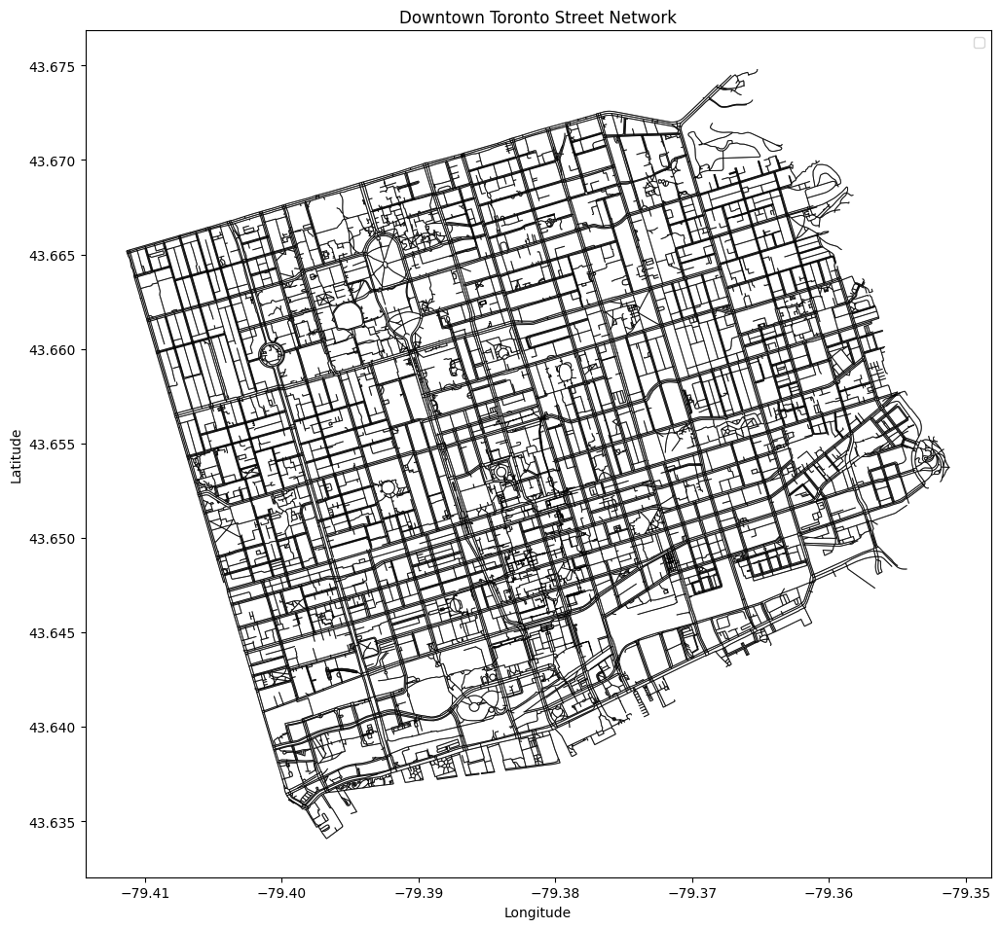

In [ ]:
# Graph 1

# Download the street network within the downtown polygon
G = ox.graph_from_polygon(downtown_polygon, network_type='walk')


nodes, edges = ox.graph_to_gdfs(G)
intersections = nodes[nodes['street_count'] > 1]

# Plot 1: Network with intersections only (no POIs)
fig, ax = plt.subplots(figsize=(12, 12))
edges.plot(ax=ax, linewidth=0.7, color="black", alpha=0.7)


plt.legend()
plt.title("Downtown Toronto Street Network")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.show()

In [ ]:
G = ox.graph_from_polygon(downtown_polygon, network_type='walk')
nodes, edges = ox.graph_to_gdfs(G)
intersections = nodes[nodes['street_count'] > 1]

Selected Node Information:
y                                    43.669229
x                                   -79.392134
highway                                    NaN
street_count                                 3
railway                                    NaN
ref                                        NaN
geometry        POINT (-79.3921344 43.6692293)
Name: 3725518645, dtype: object


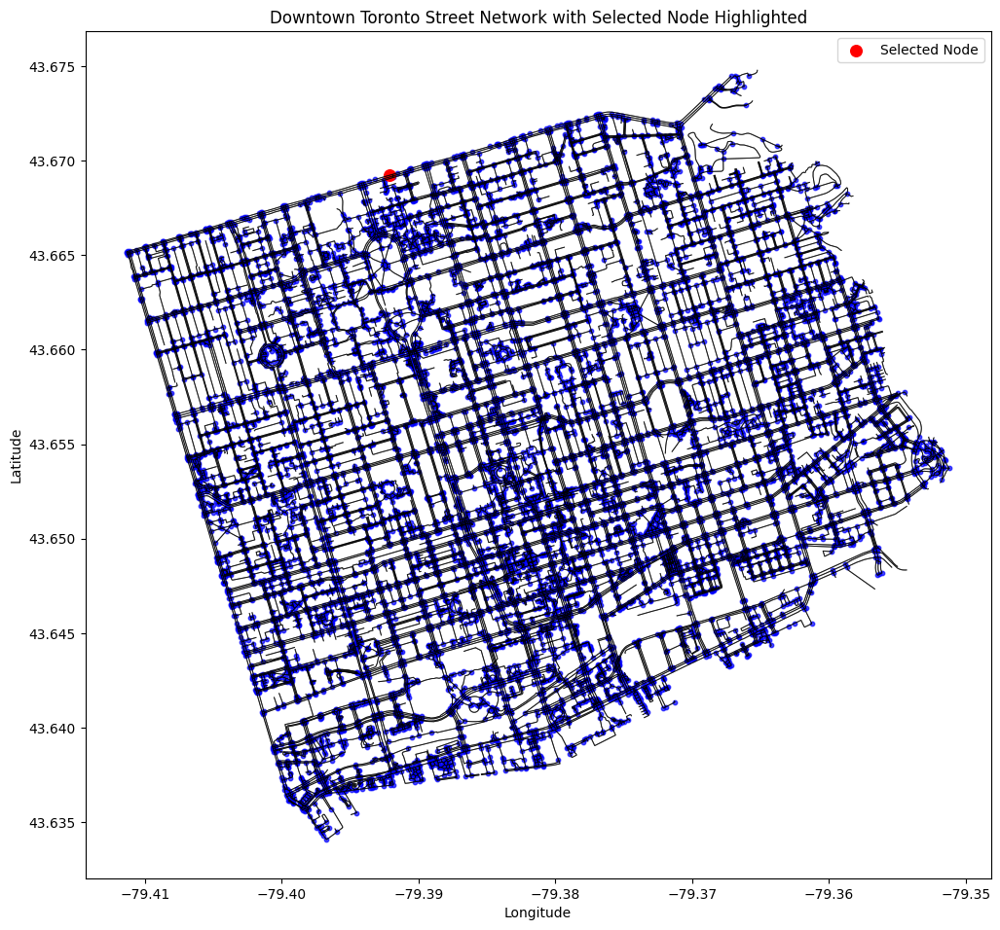

In [ ]:
# Randomly select a node
selected_node = intersections.sample(1)
node_info = selected_node.iloc[0]
print("Selected Node Information:")
print(node_info)


fig, ax = plt.subplots(figsize=(12, 12))
edges.plot(ax=ax, linewidth=0.7, color="black", alpha=0.7)
intersections.plot(ax=ax, markersize=10, color="blue", alpha=0.7)


selected_node.plot(ax=ax, color="red", markersize=70, label="Selected Node")


plt.legend()
plt.title("Downtown Toronto Street Network with Selected Node Highlighted")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.show()

Selected Node Information:
y                                    43.647348
x                                   -79.380994
highway                                    NaN
street_count                                 3
railway                                    NaN
ref                                        NaN
geometry        POINT (-79.3809941 43.6473482)
Name: 3559450462, dtype: object


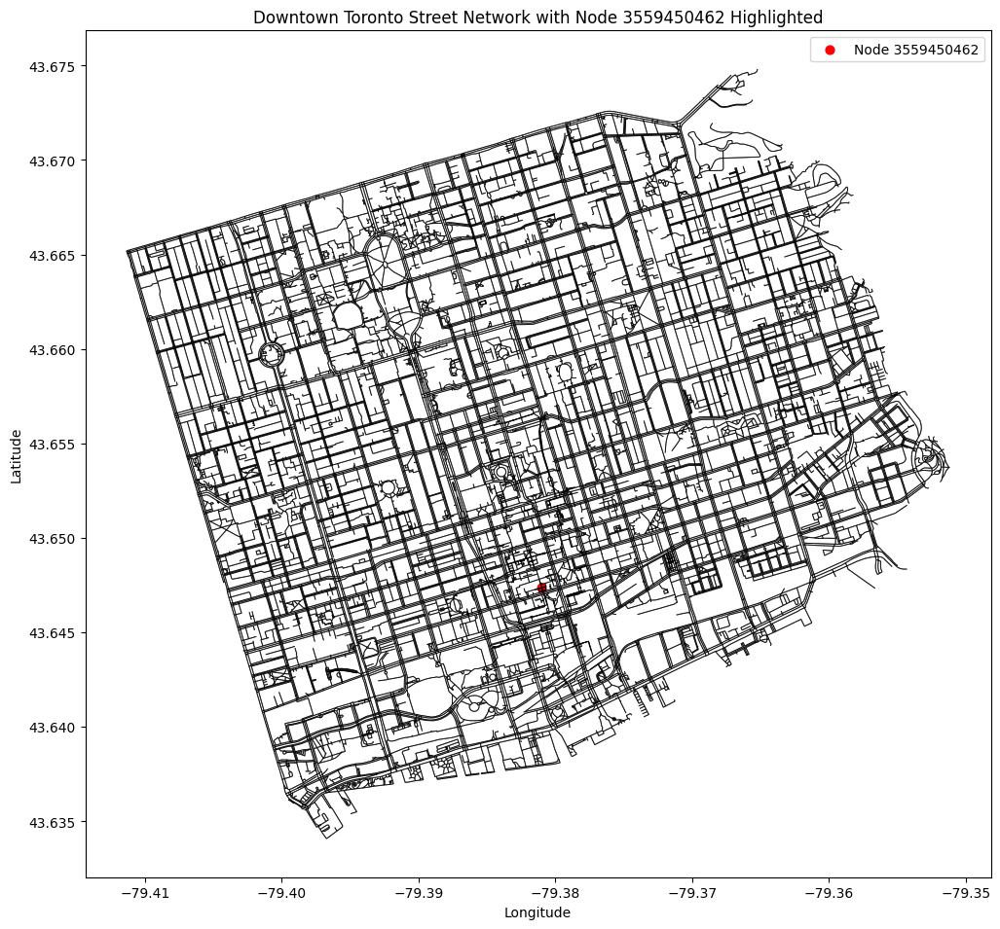

In [ ]:
fig, ax = plt.subplots(figsize=(12, 12))
edges.plot(ax=ax, linewidth=0.7, color="black", alpha=0.7)
node = 3559450462

# Highlight specific node
if node in nodes.index:  # Check if the node exists
    node_info = nodes.loc[node]  # Extract the node information
    node_object = intersections.loc[node]
    print("Selected Node Information:")
    print(node_info)
    node_coords = nodes.loc[node, 'geometry']  # Extract node geometry
    ax.scatter(node_coords.x, node_coords.y, color="red", s=40, alpha=1, label=f"Node {node}")
else:
    print(f"Node {node} not found in the nodes GeoDataFrame.")

# Add plot details
plt.legend()
plt.title(f"Downtown Toronto Street Network with Node {node} Highlighted")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.show()

##Graph 2: Randomized Path Selection  and Highlighted Node and Route

Could not construct a route with exactly 10 edges.


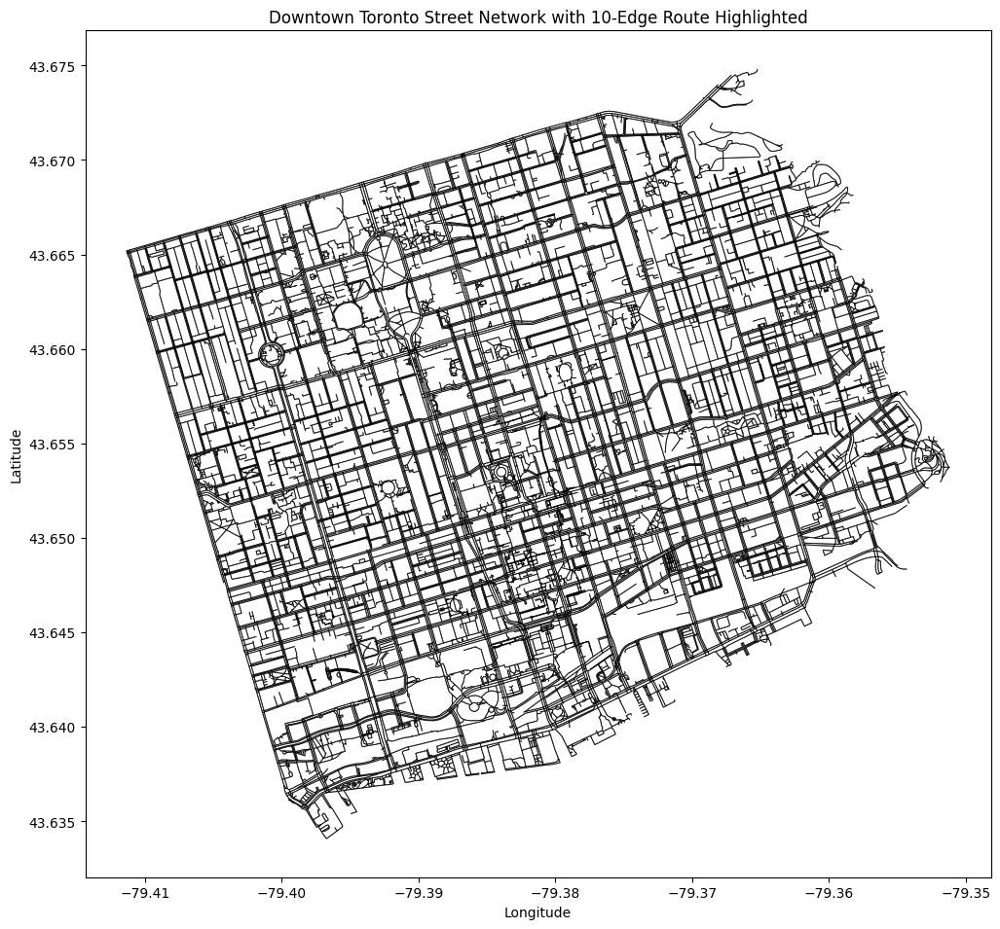

In [ ]:
# Graph 2

# Randomly choose a starting node
start_node = random.choice(list(G.nodes))

# Initialize variables for route, length, and visited nodes
route = []
total_length = 0
current_node = start_node
visited_nodes = {start_node}

# Build a route with exactly 10 edges without revisiting nodes
for _ in range(10):
    # Get all neighbors of the current node that haven't been visited
    neighbors = [n for n in G.neighbors(current_node) if n not in visited_nodes]
    if not neighbors:
        break
    next_node = random.choice(neighbors)

    # Check if the edge exists and has a 'length' attribute
    edge_data = G.get_edge_data(current_node, next_node, 0)
    if edge_data and 'length' in edge_data:
        route.append((current_node, next_node))
        total_length += edge_data['length']

        # Move to the next node and mark it as visited
        current_node = next_node
        visited_nodes.add(current_node)
    else:
        break

# Extract nodes and edges as GeoDataFrames
nodes, edges = ox.graph_to_gdfs(G)
intersections = nodes[nodes['street_count'] > 1]


fig, ax = plt.subplots(figsize=(12, 12))
edges.plot(ax=ax, linewidth=0.7, color="black", alpha=0.7)

# Highlight the route if found
if len(route) == 10:
    for u, v in route:
        edge_data = G.edges[u, v, 0]

        # Check if 'geometry' exists; if not, create a simple line between nodes
        if 'geometry' in edge_data:
            edge_geom = edge_data['geometry']
        else:
            # Get coordinates of the nodes to create a straight line
            x_start, y_start = G.nodes[u]['x'], G.nodes[u]['y']
            x_end, y_end = G.nodes[v]['x'], G.nodes[v]['y']
            edge_geom = [(x_start, y_start), (x_end, y_end)]


        if isinstance(edge_geom, list):
            x_coords, y_coords = zip(*edge_geom)
            ax.plot(x_coords, y_coords, color='red', linewidth=3)
        else:
            ax.plot(*edge_geom.xy, color='red', linewidth=3)

    print(f"Random route with 10 edges found and highlighted. Total length: {total_length:.2f} meters")
else:
    print("Could not construct a route with exactly 10 edges.")

plt.title("Downtown Toronto Street Network with 10-Edge Route Highlighted")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.show()

## Graph 3: Road Classification Visualization

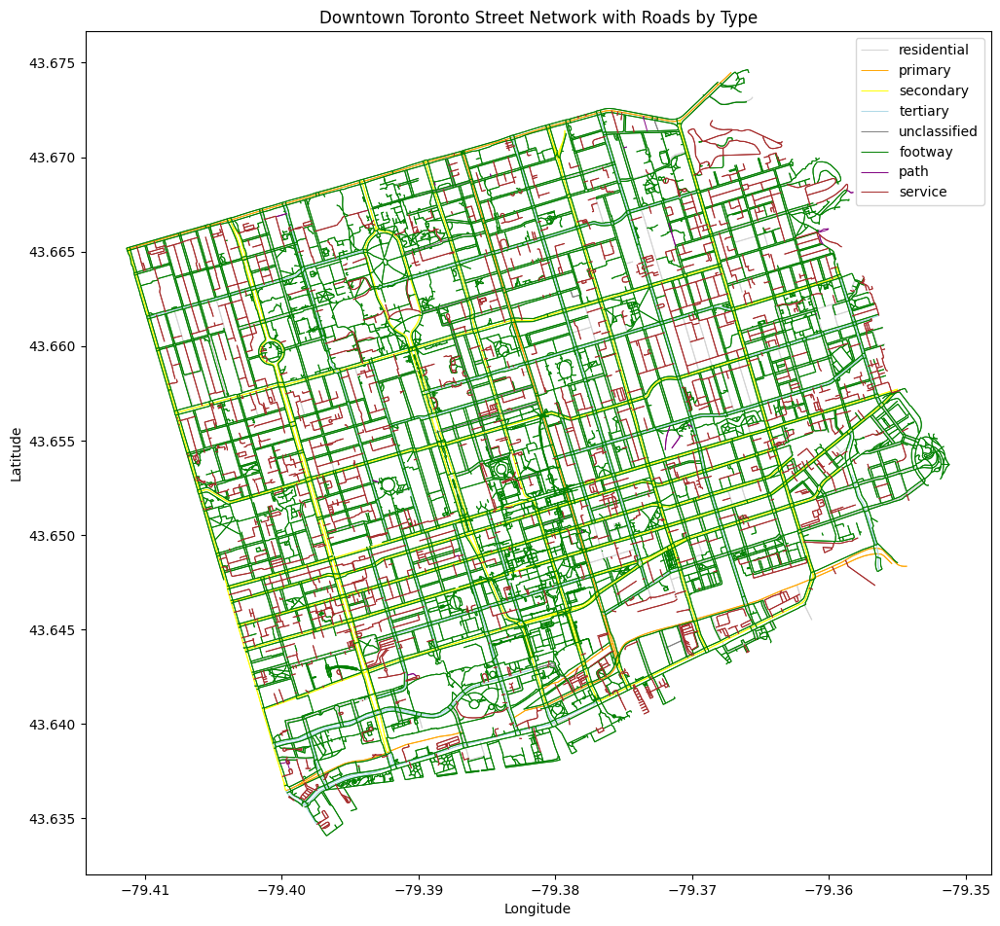

In [ ]:
# Graph 3

# Define colors for each type of road
road_colors = {
    'residential': 'lightgrey',
    'primary': 'orange',
    'secondary': 'yellow',
    'tertiary': 'lightblue',
    'unclassified': 'grey',
    'footway': 'green',
    'path': 'purple',
    'cycleway': 'blue',
    'service': 'brown',
    'track': 'pink',
    'other': 'black'
}


# Ensure that each road has a known type; otherwise, set it to 'other'
edges['highway'] = edges['highway'].apply(lambda x: x[0] if isinstance(x, list) else x)
edges['highway'] = edges['highway'].fillna('other')

# Plot the network with different colors for each type of road
fig, ax = plt.subplots(figsize=(12, 12))
for road_type, color in road_colors.items():
    road_subset = edges[edges['highway'] == road_type]
    if not road_subset.empty:
        road_subset.plot(ax=ax, linewidth=0.7, color=color, label=road_type)


# Add legend and labels
plt.legend()
plt.title("Downtown Toronto Street Network with Roads by Type")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.show()


## Graph 4: Intersections and POIs

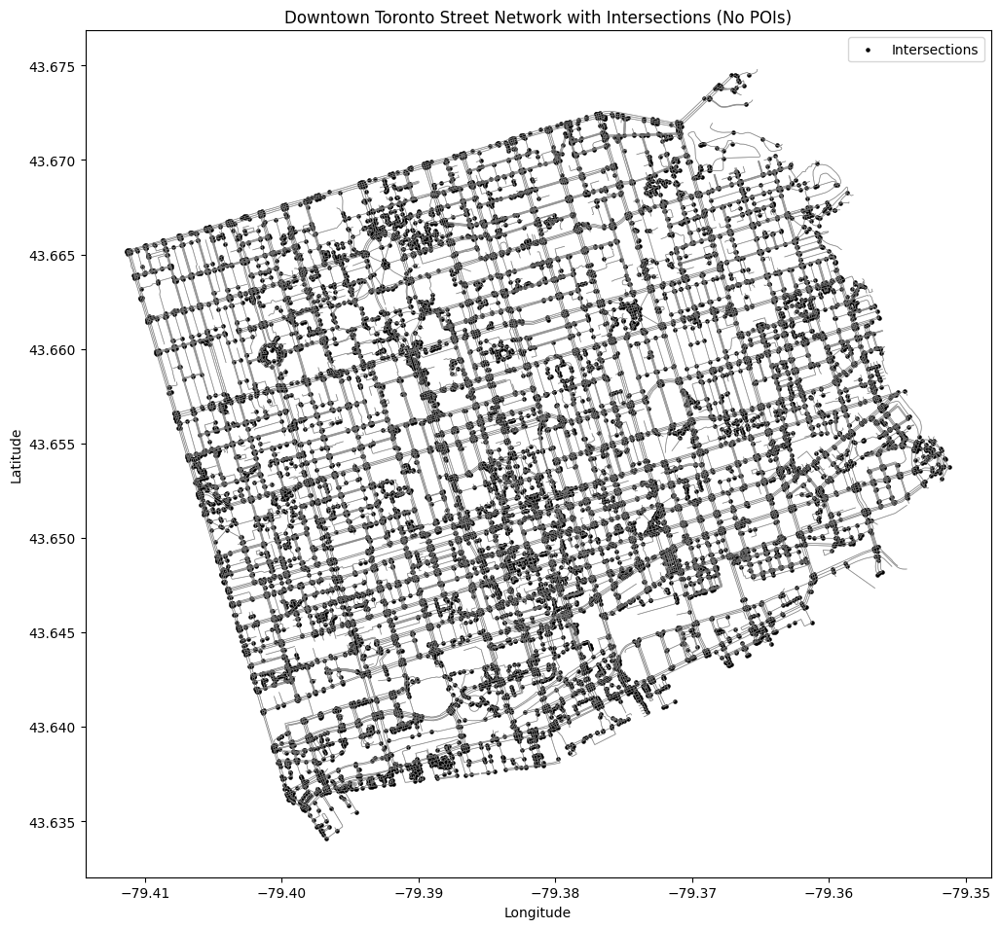

In [ ]:
# Graph 4

# Extract nodes and edges as GeoDataFrames
nodes, edges = ox.graph_to_gdfs(G)
intersections = nodes[nodes['street_count'] > 1]  # Filter to only intersection nodes

# Plot 1: Network with intersections only (no POIs)
fig, ax = plt.subplots(figsize=(12, 12))
edges.plot(ax=ax, linewidth=0.5, color="gray", alpha=0.7)
intersections.plot(ax=ax, color="black", markersize=5, label="Intersections")

plt.legend()
plt.title("Downtown Toronto Street Network with Intersections (No POIs)")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.show()

## Graph 5: Plot Street Network and POIs

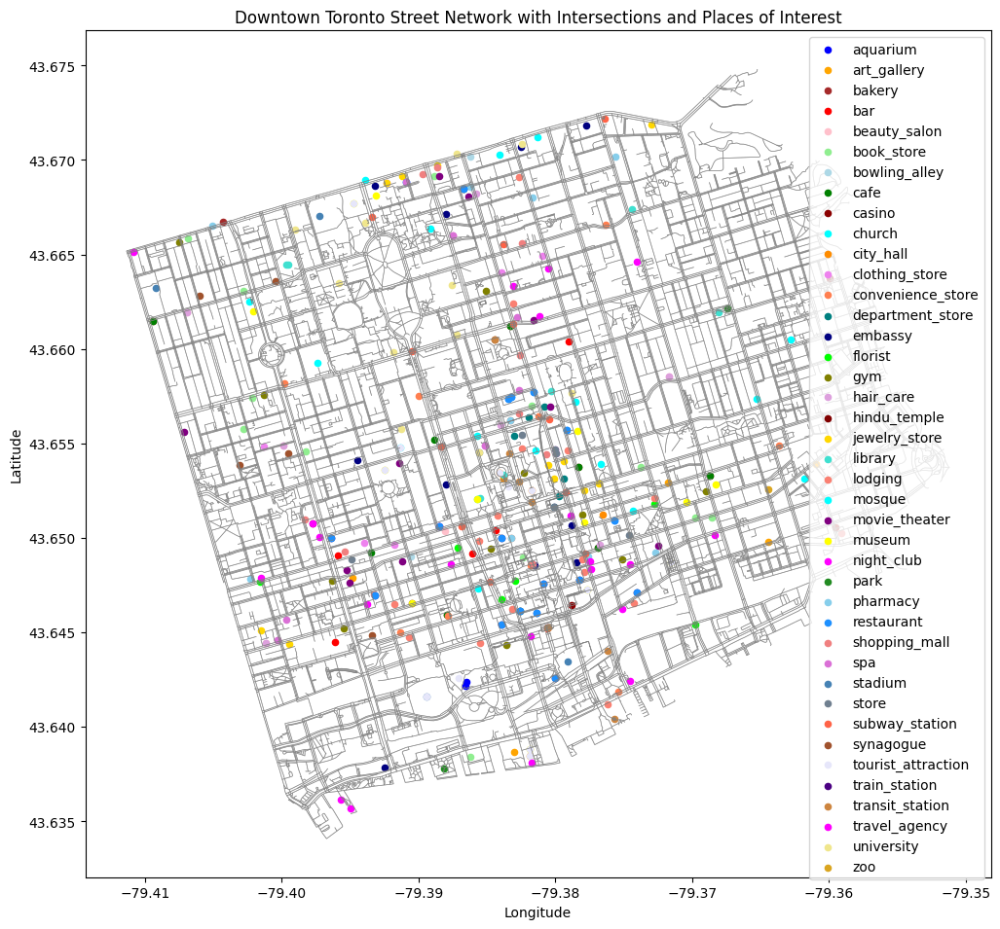

In [ ]:
# Graph 5

fig, ax = plt.subplots(figsize=(12, 12))
edges.plot(ax=ax, linewidth=0.5, color="gray", alpha=0.7)
# intersections.plot(ax=ax, color="black", markersize=1, label="Intersections")

# Plot each POI type with a different color
for poi_type, color in poi_colors.items():
    poi_subset = poi_within_downtown[poi_within_downtown["Type"] == poi_type]
    if not poi_subset.empty:
        poi_subset.plot(ax=ax, color=color, markersize=20, label=poi_type)

plt.legend()
plt.title("Downtown Toronto Street Network with Intersections and Places of Interest")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.show()

### Define an Interest Score (I) for each POI that takes into account:
Review Score (R) - This is the average rating of the POI (e.g., from 1 to 5).
Number of Reviews (N) - The total number of reviews for the POI, indicating its popularity.

#### A simple formula could be:
##### I=R×log(1+N)

### Explanation:
R (Review Score): Higher ratings contribute directly to a higher Interest Score.

log(1+N) (Logarithm of the Number of Reviews): This term increases the score proportionally to the number of reviews, giving a diminishing effect for very high numbers of reviews.

The logarithmic function is helpful because it emphasizes differences at low review counts while limiting the effect at high counts, balancing popularity without overly favoring high-review POIs.

In [ ]:
# Define the Interest Score formula
def calculate_interest_score(row):
    review_score = row["Rating"] if not pd.isna(row["Rating"]) else 0  # Default to 0 if NaN
    num_reviews = row["Total User Ratings"] if not pd.isna(row["Total User Ratings"]) else 0  # Default to 0 if NaN
    # Calculate the Interest Score
    return review_score * np.log1p(num_reviews)  # np.log1p(x) is log(1 + x)


places_df["Interest Score"] = places_df.apply(calculate_interest_score, axis=1)


places_df.sort_values(by="Interest Score", ascending=False)

,Type,Name,Address,Rating,Total User Ratings,Place ID,Types,Latitude,Longitude,Interest Score
638,tourist_attraction,CN Tower,"290 Bremner Boulevard, Toronto",4.6,75213.0,ChIJmzrzi9Y0K4gRgXUc3sTY7RU,"tourist_attraction, point_of_interest, establi...",43.642566,-79.387057,51.649226
8,aquarium,Ripley's Aquarium of Canada,"288 Bremner Boulevard, Toronto",4.6,60314.0,ChIJWwS21dU0K4gRPSGMKRkar40,"aquarium, point_of_interest, establishment",43.642178,-79.386602,50.633746
424,museum,Royal Ontario Museum,"100 Queens Park, Toronto",4.7,36974.0,ChIJE-Xa87o0K4gRkvXFHuE0hMk,"tourist_attraction, museum, point_of_interest,...",43.667710,-79.394777,49.434587
641,tourist_attraction,Royal Ontario Museum,"100 Queens Park, Toronto",4.7,36974.0,ChIJE-Xa87o0K4gRkvXFHuE0hMk,"tourist_attraction, museum, point_of_interest,...",43.667710,-79.394777,49.434587
645,tourist_attraction,Nathan Phillips Square,"100 Queen Street West, Toronto",4.6,37232.0,ChIJBxZ2UMw0K4gR1LmKMBvveP0,"tourist_attraction, point_of_interest, establi...",43.652707,-79.383414,48.414773
...,...,...,...,...,...,...,...,...,...,...
661,transit_station,Standard Parking,"777 Bay Street, Toronto",NaN,NaN,ChIJnUz2uLU0K4gRn6oIo12dSMM,"bus_station, transit_station, point_of_interes...",43.660489,-79.384447,0.000000
438,museum,Haley Sharpe Design (Canada) Inc.,"75 Sherbourne Street, Toronto",NaN,NaN,ChIJP_4dvts0K4gRafRrOjRymAw,"museum, point_of_interest, establishment",43.652801,-79.368257,0.000000
439,museum,Tatar Art Projects,"147 Liberty Street Suite 202, Toronto",NaN,NaN,ChIJr5GtwN40K4gRNqKYy4ZY66s,"art_gallery, museum, local_government_office, ...",43.637403,-79.424385,0.000000
242,embassy,Jamaica Trade & Invest,"303 Eglinton Avenue East, Toronto",NaN,NaN,ChIJ-WPhXi4zK4gRBRAHMYOWV6A,"embassy, point_of_interest, establishment",43.708765,-79.387604,0.000000


## Graph 6: Plot POIs by Interest Score

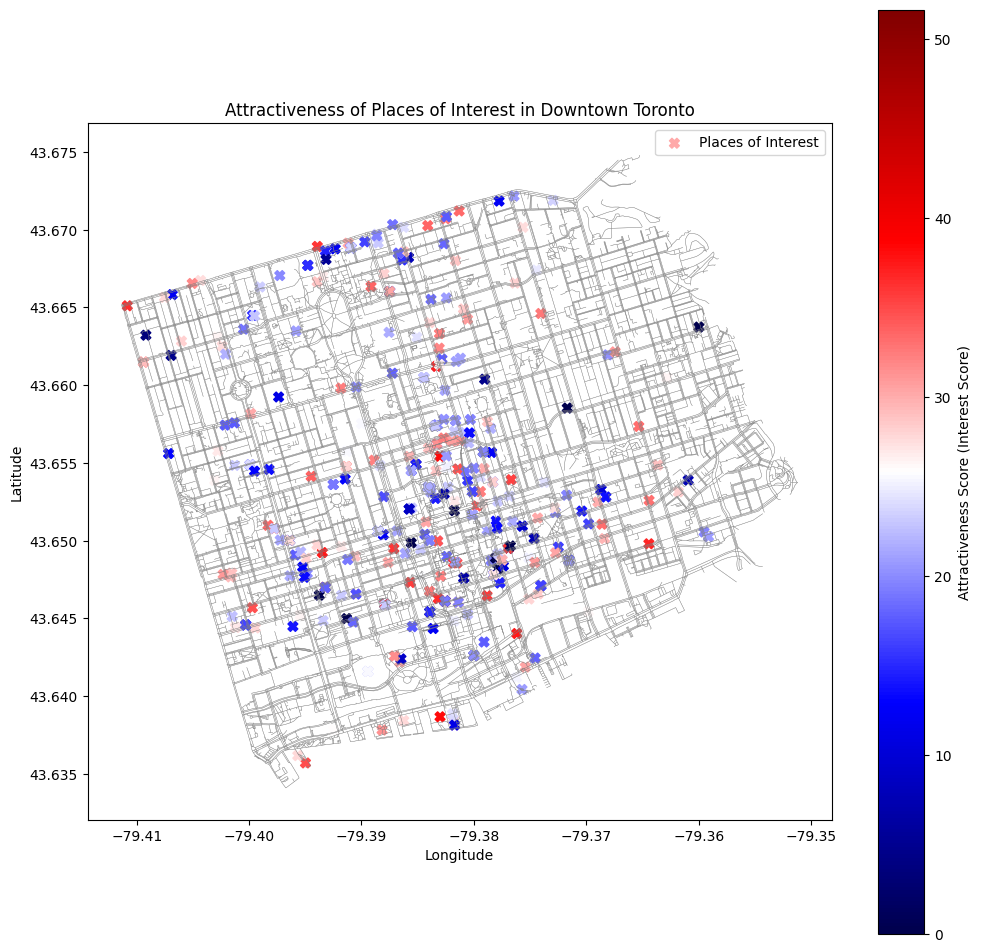

In [ ]:
# Graph 6

# Normalize interest scores to map them to a custom color scale from black to yellow
norm = plt.Normalize(places_df["Interest Score"].min(), places_df["Interest Score"].max())
cmap = plt.cm.seismic  # Closely matches the black-red-orange-yellow scale

fig, ax = plt.subplots(figsize=(12, 12))
edges.plot(ax=ax, linewidth=0.3, color="gray", alpha=0.7)
# intersections.plot(ax=ax, color="black", markersize=2, label="Intersections")

poi_within_downtown.plot(
    ax=ax,
    color=[cmap(norm(score)) for score in places_df["Interest Score"]],
    marker="X",
    markersize=50,
    label="Places of Interest"
)

# Add colorbar to interpret scores with the custom color scale
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax)
cbar.set_label("Attractiveness Score (Interest Score)")

plt.title("Attractiveness of Places of Interest in Downtown Toronto")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend()
plt.show()

## Graph 7: Heatmap of Attractiveness Density

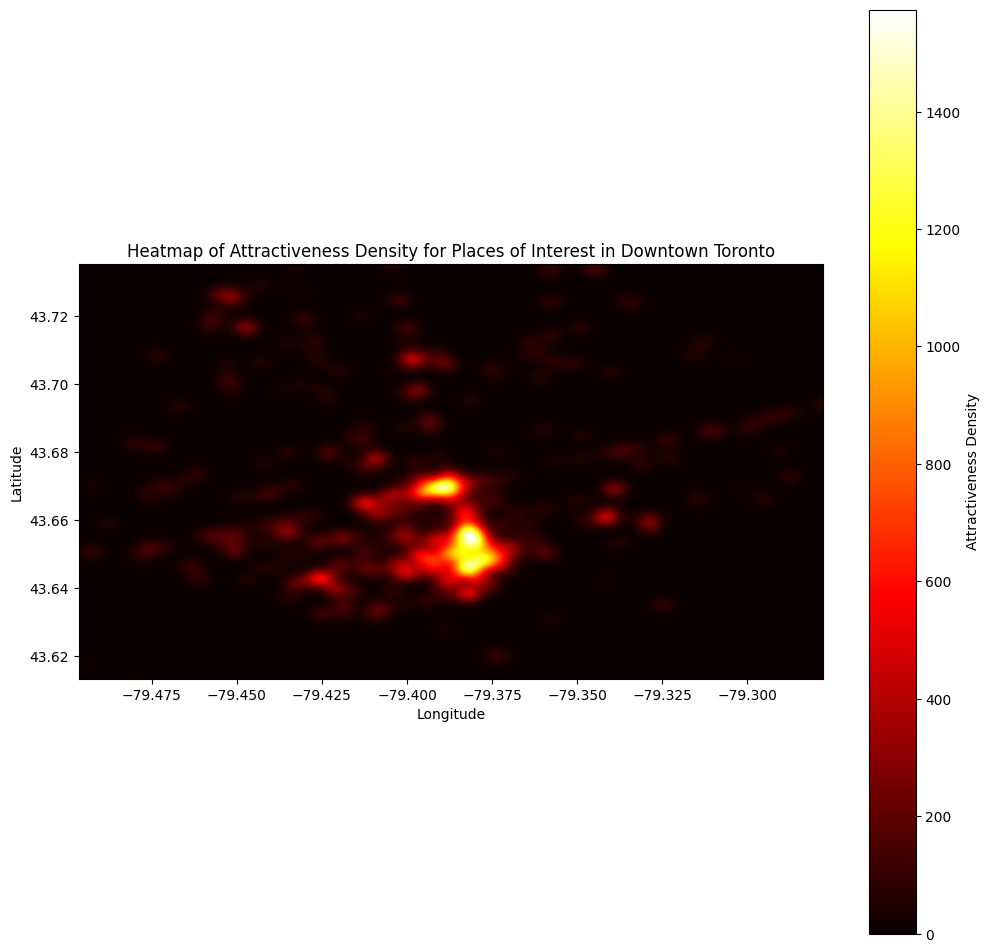

In [ ]:
# Graph 7

x = places_df['Longitude']
y = places_df['Latitude']
scores = places_df['Interest Score']

kde = gaussian_kde([x, y], weights=scores, bw_method=0.08)

x_min, x_max = x.min(), x.max()
y_min, y_max = y.min(), y.max()
x_grid, y_grid = np.mgrid[x_min:x_max:500j, y_min:y_max:500j]
positions = np.vstack([x_grid.ravel(), y_grid.ravel()])


density = kde(positions).reshape(x_grid.shape)

# Plot the heatmap
fig, ax = plt.subplots(figsize=(12, 12))
plt.imshow(np.rot90(density), cmap='hot', extent=[x_min, x_max, y_min, y_max])
plt.colorbar(label="Attractiveness Density")
# plt.scatter(x, y, c='black', s=1, alpha=0.4, marker='x')  # Add POI locations for reference
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title("Heatmap of Attractiveness Density for Places of Interest in Downtown Toronto")
plt.show()

In [ ]:
geometry = [Point(xy) for xy in zip(places_df["Longitude"], places_df["Latitude"])]
poi_gdf = gpd.GeoDataFrame(places_df, geometry=geometry, crs="EPSG:4326")


def calculate_interest_score(row):
    review_score = row.get("Rating", 0)
    num_reviews = row.get("Total User Ratings", 0)
    return review_score * np.log1p(num_reviews)


if 'Interest Score' not in places_df.columns:
    places_df["Interest Score"] = places_df.apply(calculate_interest_score, axis=1)


poi_gdf = poi_gdf.to_crs(epsg=3857)
G = ox.project_graph(G, to_crs="EPSG:3857")

# Graph 8: Scenic Scores on the Street Network

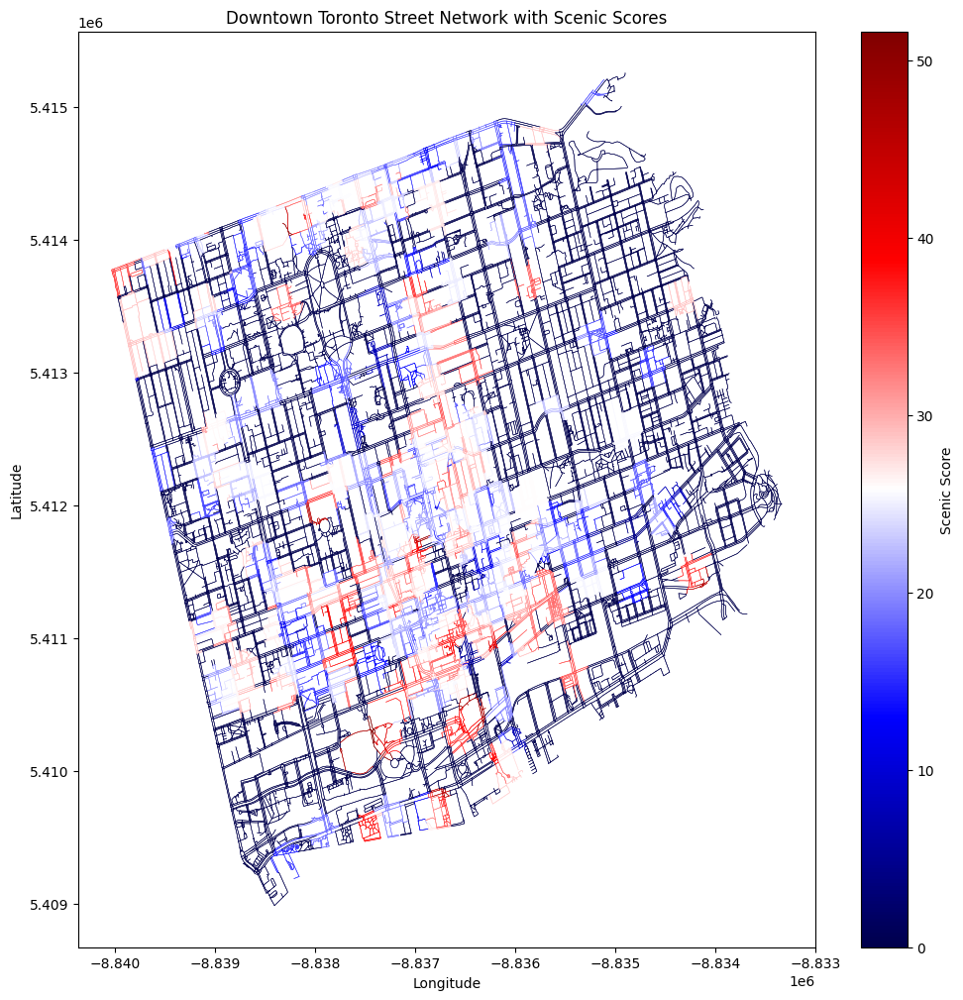

In [ ]:
def assign_scenic_scores(G, poi_gdf, radius=150):  # Radius in meters
    for u, v, data in G.edges(data=True):
        # Get start and end points in projected CRS
        u_point = Point((G.nodes[u]['x'], G.nodes[u]['y']))
        v_point = Point((G.nodes[v]['x'], G.nodes[v]['y']))
        line = LineString([u_point, v_point])

        # Calculate the midpoint of the line
        midpoint = line.interpolate(0.5, normalized=True)

        nearby_pois = poi_gdf[poi_gdf.geometry.distance(midpoint) < radius]

        # Calculate the scenic score based on nearby POIs
        scenic_score = nearby_pois["Interest Score"].mean() if not nearby_pois.empty else 0
        data['scenic_score'] = scenic_score


assign_scenic_scores(G, poi_gdf)


fig, ax = plt.subplots(figsize=(12, 12))
scenic_scores = [data['scenic_score'] for _, _, data in G.edges(data=True)]
norm = plt.Normalize(vmin=min(scenic_scores), vmax=max(scenic_scores))
cmap = plt.cm.seismic

for u, v, data in G.edges(data=True):
    line = data.get('geometry', LineString([(G.nodes[u]['x'], G.nodes[u]['y']), (G.nodes[v]['x'], G.nodes[v]['y'])]))
    color = cmap(norm(data['scenic_score']))
    x, y = line.xy
    ax.plot(x, y, color=color, linewidth=0.4)


sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
cbar = plt.colorbar(sm, ax=ax)
cbar.set_label("Scenic Score")

plt.title("Downtown Toronto Street Network with Scenic Scores")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.show()


In [ ]:
# Initialize counters
total_data_count = 0
edges_without_geometry = 0
edges_without_scenic_score = 0
length = 0

# Iterate through all edges with their attributes
for _, _, data in G.edges(data=True):
    total_data_count += len(data)  # Add the number of attributes in the current edge
    if 'geometry' not in data:    # Check if 'geometry' is missing
        edges_without_geometry += 1
    if 'scenic_score' not in data:
        edges_without_scenic_score += 1
    if 'length' not in data:
        length += 1

# Print the results

print("Total number of attributes across all edges:", total_data_count)
print("Number of edges without 'geometry':", edges_without_geometry)
print("Number of edges without 'scenic_score':", edges_without_scenic_score)
print("Number of edges without 'length':", length)


Total number of attributes across all edges: 336802
Number of edges without 'geometry': 26616
Number of edges without 'scenic_score': 0
Number of edges without 'length': 0


#Problem Formulation
The optimization goal is to minimize the total distance of the route while maximizing the scenic appeal. This is expressed by the following formula:

$$
S(G'') = \min \left( \sum_{e \in P} w(e) - \lambda \sum_{e \in P} a(e) \right)
$$

where:

- **$S(G'')$** : represents the final score of the route \(G''\).  
- **$\sum_{e \in P} w(e)$** : is the total distance of the route, summing up all edges $(e \in E)$, where $(P \subseteq E)$ represents the set of edges in the chosen path.  
- **$\lambda \sum_{e \in P} a(e)$** : is the total scenic appeal of the edges in the path, weighted by $\lambda$, which controls the importance of scenic appeal relative to distance.  
- **$\lambda$** : is a tunable parameter that determines the trade-off between minimizing distance and maximizing scenic appeal. In this study, this parameter is defaulted to 1 to maximize the scenic appeal.  

# Genetic Algorithm for Route Optimization
For this specific test, we choose the node 3559450462 that is shown above.

---

### Node Information:
- **y:** 43.647348  
- **x:** -79.380994  
- **highway:** NaN  
- **street_count:** 3  
- **railway:** NaN  
- **ref:** NaN  
- **geometry:** POINT (-79.3809941 43.6473482)  

**Name:** 3559450462, dtype: object

In [ ]:
class GeneticSolver:
    def __init__(self, graph, pop_size, route_length, distance_weight=1.0, scenic_weight=1.0, crossover_rate=0.9, mutation_rate=0.1):
        self.graph = graph
        self.pop_size = pop_size
        self.route_length = route_length
        self.distance_weight = distance_weight  # Weight for distance
        self.scenic_weight = scenic_weight  # Weight for scenic score
        self.crossover_rate = crossover_rate
        self.mutation_rate = mutation_rate
        self.population = self.initialize_population()
        self.best_route = None
        self.best_score = float('inf')
        self.best_fitness_per_generation = []

    def initialize_population(self):
        """Generates the initial population of random routes."""
        population = []
        for _ in range(self.pop_size):
            route = self.generate_random_route()
            population.append(route)
        return population

    def generate_random_route(self):
        """Generates a random connected route starting and ending at the same node."""
        # Filter nodes with a scenic_score > 0
        valid_start_nodes = [
            node for node in self.graph.nodes
            if any(
                edge_data.get('scenic_score', 0) > 0
                for _, _, edge_data in self.graph.edges(node, data=True)
            )
        ]

        if not valid_start_nodes:
            raise ValueError("No valid starting nodes with scenic_score > 0 found in the graph.")

        # Randomly select a start node
        start_node = 3559450462
        route = [start_node]

        visited_nodes = set(route)
        current_node = start_node
        for _ in range(self.route_length // 3 - 2):
            neighbors = [
                neighbor for neighbor in self.graph.neighbors(current_node)
                if neighbor not in visited_nodes and self.have_edge_data(self.graph, current_node, neighbor)
            ]
            if not neighbors:
                break  # No more connected neighbors
            next_node = random.choice(neighbors)
            route.append(next_node)
            visited_nodes.add(next_node)
            current_node = next_node

        # Add the start node as the end node
        route.append(start_node)
        self.repair_route(route)
        return route


    def crossover(self):
        """Performs crossover ensuring connected routes."""
        num_children = self.pop_size // 2
        new_population = []

        for _ in range(num_children):
            if random.random() < self.crossover_rate:
                parent1, parent2 = random.sample(self.population, 2)
                while parent1 == parent2:
                    parent2 = random.choice(self.population)
                start, end = sorted(random.sample(range(1, len(parent1)-1), 2))
                child1 = parent1[:start] + [node for node in parent2 if node not in parent1[start:end]] + parent1[end:]
                child2 = parent2[:start] + [node for node in parent1 if node not in parent2[start:end]] + parent2[end:]

                # Repair and validate connectivity
                child1 = self.repair_route(child1)
                child2 = self.repair_route(child2)

                if child1 and self.is_route_connected(child1) and len(child1) > 5:
                    new_population.append(child1)
                if child2 and self.is_route_connected(child2) and len(child2) > 5:
                    new_population.append(child2)

        self.population.extend(new_population)

    def mutate(self):
        """Performs mutation on the population, ensuring connectivity."""
        for i in range(len(self.population)):
            if random.random() < self.mutation_rate:
                route = self.population[i]

                # Swap two random nodes
                idx1, idx2 = random.sample(range(1, len(route)-1), 2)
                route[idx1], route[idx2] = route[idx2], route[idx1]

                # Repair and validate connectivity
                repaired_route = self.repair_route(route)
                if repaired_route and self.is_route_connected(repaired_route):
                    self.population[i] = repaired_route

    def fitness_func(self):
        """Evaluates the fitness of each route."""
        fitness_scores = []
        # self.population = random.sample(self.population, k=min(self.pop_size, len(self.population)))

        for route in self.population:
            if len(route) < 6:
                self.population.remove(route)
            elif len(route) > self.route_length:
                self.population.remove(route)
            else:
                total_distance = 0
                total_scenic_score = 0
                penalty = 0
                for i in range(len(route) - 1):
                    u, v = route[i], route[i + 1]
                    edge_data = self.graph.get_edge_data(u, v, default={})
                    # Check reverse edge if necessary
                    if not edge_data:
                        edge_data = self.graph.get_edge_data(v, u, default={})

                    # Penalize if edge_data is missing
                    if not edge_data:
                        continue

                    # Accumulate distance and scenic score
                    total_distance += edge_data[0].get('length', 0)
                    total_scenic_score += edge_data[0].get('scenic_score', 0)
                # Combine objectives into a fitness value

                fitness = (self.distance_weight * total_distance) - (self.scenic_weight * total_scenic_score)
                if(fitness == 0): continue
                fitness_scores.append(fitness)
                # Track the best route
                if fitness < self.best_score:
                    self.best_score = fitness
                    self.best_route = route
        print(f"Fitness scores for current generation: {fitness_scores}")
        self.best_fitness_per_generation.append(self.best_score)
        # Sort population by fitness
        self.population = [route for _, route in sorted(zip(fitness_scores, self.population))]

    def select_parents(self):
        """Selects the top half of the population as parents."""
        self.population = random.sample(self.population, k=min(self.pop_size, len(self.population)))

    def solve(self, generations=100):
        """Runs the genetic algorithm for a specified number of generations."""
        for generation in range(generations):
            self.crossover()
            self.mutate()
            self.fitness_func()
            self.select_parents()
            print(f"Generation {generation + 1}: Best Fitness = {self.best_score}")

        self.best_fitness_per_generation = [cost - min(self.best_fitness_per_generation) for cost in self.best_fitness_per_generation]
        print(f"Costs for all generation: {self.best_fitness_per_generation}")

        return self.best_route, self.best_score, self.best_fitness_per_generation

    def is_route_connected(self, route):
        """Checks if the given route is fully connected in the graph."""
        for i in range(len(route) - 1):
            if not self.graph.has_edge(route[i], route[i + 1]) and self.have_edge_data(self.graph,route[i], route[i + 1]):
                return False  # Disconnected
        return True

    def have_edge_data(self, G, current_node, next_node):
        edge_data = G.get_edge_data(current_node, next_node, default=None)
        if edge_data or G.get_edge_data(next_node,current_node , default=None):
            return True
        return False

    def repair_route(self, route):
        """Repair a route by replacing invalid edges."""
        repaired_route = [route[0]]  # Start with the first node
        for i in range(1, len(route)):
            current_node = repaired_route[-1]
            next_node = route[i]
            if next_node != route[-1]:
              if self.graph.has_edge(current_node, next_node) and self.have_edge_data(self.graph, current_node, next_node):
                  repaired_route.append(next_node)
              else:
                  # Find a valid replacement node
                  neighbors = [
                      neighbor for neighbor in self.graph.neighbors(current_node)
                      if neighbor not in repaired_route and self.have_edge_data(self.graph, current_node, neighbor)
                  ]
                  if neighbors:
                      repaired_route.append(random.choice(neighbors))
                  else:
                      return None  # Unable to repair the route
            else:
              if self.graph.has_edge(current_node, next_node) and self.have_edge_data(self.graph, current_node, next_node):
                  repaired_route.append(next_node)
                  break
              else:
                  additional_route = self.find_route(current_node, next_node, [repaired_route[4:-1]])
                  repaired_route.extend(additional_route)
                  break
        return repaired_route

    def find_route(self, start_node, end_node, unavailables = [], retries = 300):
        if retries <= 0:
          raise Exception("No route found")
        route = [start_node]
        current_node = start_node
        while current_node != end_node:
            neighbors = [
                neighbor for neighbor in self.graph.neighbors(current_node)
                if neighbor not in route and neighbor not in unavailables and self.have_edge_data(self.graph, current_node, neighbor)
            ]
            if not neighbors:
                unavailables.append(current_node)
                route.pop()
                current_node = route[-1]
            else:
                next_node = random.choice(neighbors)
                route.append(next_node)
                current_node = next_node
        return route




In [ ]:
# Parameters
pop_size = 100
route_length = 150
generations = 30
distance_weight = 0.5  # Adjust to prioritize distance
scenic_weight = 2    # Adjust to prioritize scenic score
crossover_rate = 0.9
mutation_rate = 0.1

# Create the solver
solver = GeneticSolver(
    graph=G,
    pop_size=pop_size,
    route_length=route_length,
    distance_weight=distance_weight,
    scenic_weight=scenic_weight,
    crossover_rate=crossover_rate,
    mutation_rate=mutation_rate
)

# Solve
best_route, best_fitness, costs = solver.solve(generations=generations)
print("Best Route:", best_route)
print("Best Fitness:", best_fitness)

Fitness scores for current generation: [-1305.5163899172453, -356.38062897454245, -302.23658132282594, -353.15618075176053, -275.21105896636266, -275.21105896636266, -403.1726479901797, -433.4026050556465, -382.7317969494295, -1145.2540870370801, -1426.2032276396249, -761.7227024826493, -541.8590019735774, -1673.4509655075017, -1052.4016298793636, -453.74684015606636, -353.15618075176053, -1615.6129798913475, -411.4517665597078, -297.6871685430591, -309.532683485543, -384.89526521079125, -1439.9003911408613, -677.6080941989242, -433.30598911531615, -236.3535889636139, -1248.9538730494744, -495.52303390617953, -459.0752684591622, -302.23658132282594, -898.0631993426304, -726.555485840448, -297.6871685430591, -527.6700878521183, -255.54932074124238, -1001.5531138305681, -183.45635374823866, -507.2671045907399, -543.6502569536633, -370.72598172735945, -336.6988760167582, -275.21105896636266, -592.066859932224, -362.20381009814196, -614.7169220163728, -1299.822699256993, -210.6083535110552

# Visualizing the Results

The GA algorithm generates the best routine and highlighted the route on map, depending on the balance between the various constraints.

Total number of edges(roads): 145


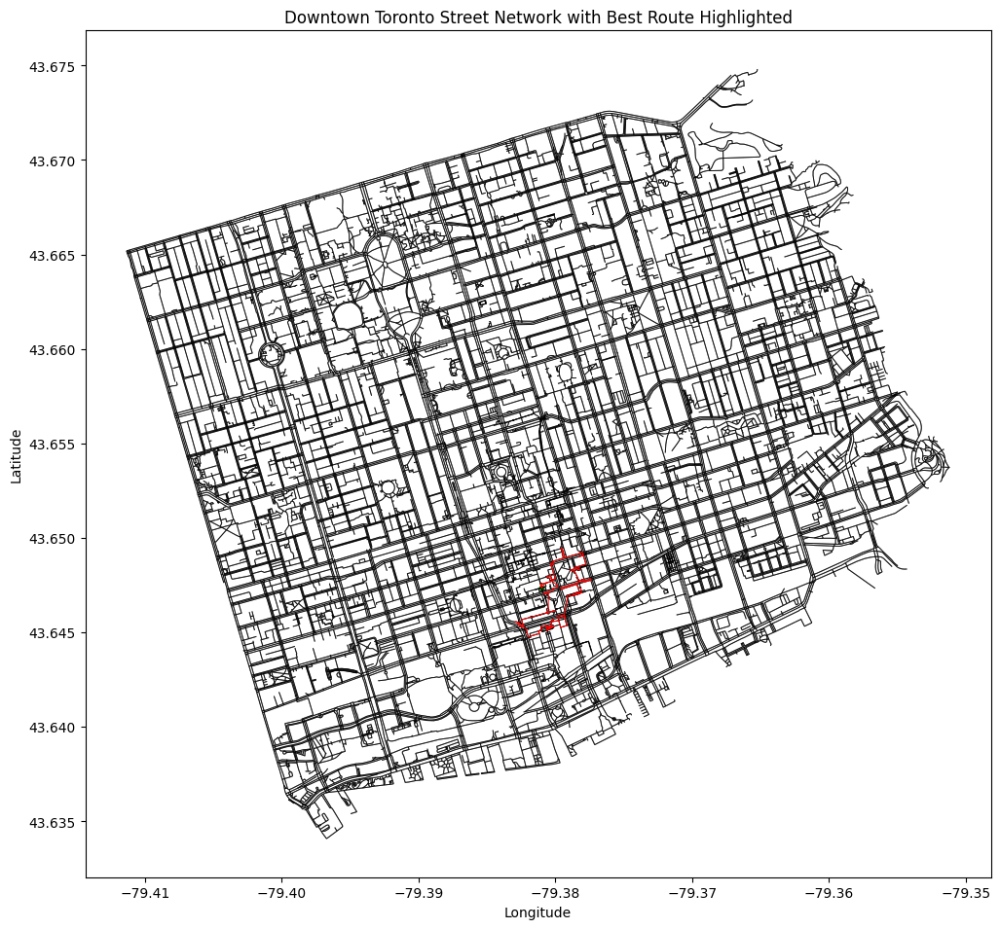

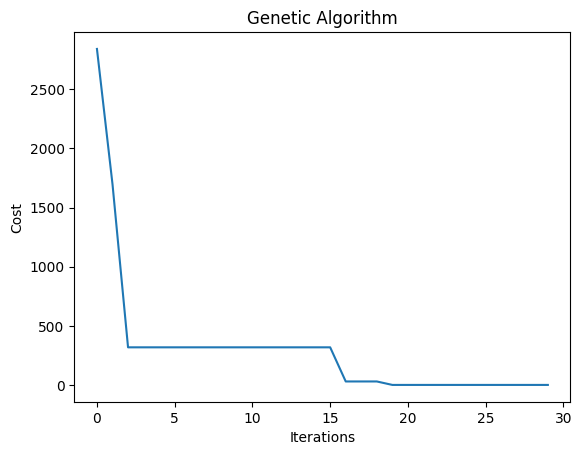

In [ ]:
G = ox.graph_from_polygon(downtown_polygon, network_type='walk')
nodes, edges = ox.graph_to_gdfs(G)
intersections = nodes[nodes['street_count'] > 1]  # Filter to only intersection nodes

# Plot the network
fig, ax = plt.subplots(figsize=(12, 12))
edges.plot(ax=ax, linewidth=0.7, color="black", alpha=0.7)

# Highlight the route if found
#if len(route) == 10:
for i in range(len(best_route) - 1):
    u, v = best_route[i], best_route[i + 1]

    edge_data = G.get_edge_data(u, v, default=None)

    if not edge_data:
        edge_data = G.get_edge_data(v, u, default=None)
    if edge_data:
        # Check if 'geometry' exists; if not, create a simple line between nodes
        if 'geometry' in edge_data:
            edge_geom = edge_data['geometry']
        else:
            # Get coordinates of the nodes to create a straight line
            x_start, y_start = G.nodes[u]['x'], G.nodes[u]['y']
            x_end, y_end = G.nodes[v]['x'], G.nodes[v]['y']
            edge_geom = [(x_start, y_start), (x_end, y_end)]

            # Plot the edge in red
        if isinstance(edge_geom, list):  # Case where geometry is manually created
            x_coords, y_coords = zip(*edge_geom)
            ax.plot(x_coords, y_coords, color='red', linewidth=0.7)
        else:  # Case where geometry exists as a LineString
            ax.plot(*edge_geom.xy, color='red', linewidth=0.7)


node = 3559450462
node_coords = nodes.loc[node, 'geometry']
ax.scatter(node_coords.x, node_coords.y, color="green", s=10, alpha=1, label=f"Node {node}")


print(f'Total number of edges(roads): {len(best_route)}')
plt.title("Downtown Toronto Street Network with Best Route Highlighted")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.show()


# Plot Iterations vs Cost
plt.plot(costs)
plt.xlabel("Iterations")
plt.ylabel("Cost")
plt.title("Genetic Algorithm")
plt.show()

In [ ]:
# best_route = [3559450462, 3700500647, 3700500645, 3367211211, 3698533577, 3367211212, 3715532448, 394493131, 3715531985, 3715531983, 3709493363, 3709493345, 3700500644, 3700500628, 3700500421, 7126891819, 7126891822, 3709734284, 3709734284, 7126891822, 768960667, 394490809, 394490784, 25628766, 1543533537, 394490746, 1543533546, 3479110586, 3496135141, 3496135140, 3496135139, 3586641990, 3586641991, 3586644097, 3584604991, 3584705899, 3584705914, 3584705915, 3584705906, 1882894448, 3584604992, 3584705898, 3584705907, 3584604990, 3584705905, 3584705911, 3584705919, 3584705923, 11289050666, 11289267367, 11289264805, 391005485, 3584705903, 11289050663, 778756832, 3584705930, 3584705931, 3584705932, 3586644100, 3584705933, 547491211, 3559602400, 3559602405, 3555217584, 3555217582, 3702010788, 3701971946, 3555217590, 3561927422, 3701971947, 3555218493, 3555218494, 3561927423, 3555217591, 3555217588, 3555217583, 3559602407, 391011823, 3561927424, 3561927425, 3561927427, 3555218504, 394493144, 390998528, 6294585463, 9963753654, 9963753655, 394497185, 394497186, 967005963, 3702186907, 6294585461, 3559397352, 3559397354, 3561927437, 547491229, 3058329343, 3327901325, 547491246, 3722099924, 3722099918, 3674135254, 2401041343, 1883781382, 766937196, 2146907764, 394497190, 3697981901, 3722134191, 3722134193, 3722134192, 3722134194, 3722117338, 3722117337, 3705565838, 3582220595, 3705798353, 3705798354, 469104501, 3559283267, 3559283259, 3559283256, 3559283249, 394497123, 390998527, 394497111, 394497110, 29605052, 391012576, 394497109, 3570692003, 3700500656, 3698533584, 3715537285, 3698533582, 3698533591, 3700500653, 3329398432, 3367211212, 3698533577, 391005488, 3367211211, 3700500645, 3700500647, 3559450462]

*The following figure will also show all the POIs within the map, which gives a better picture of the algorithm's performance, observing the correlation between the seleted route and the POIs*

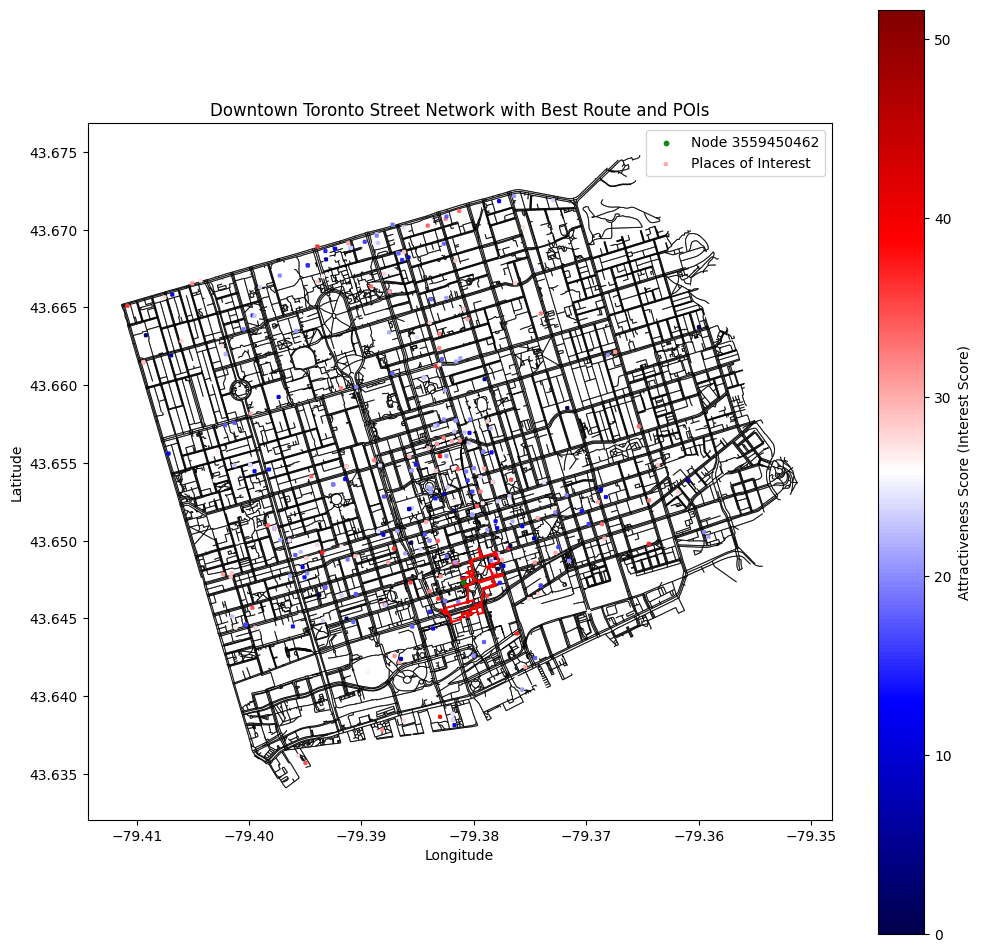

In [ ]:
nodes, edges = ox.graph_to_gdfs(G)

fig, ax = plt.subplots(figsize=(12, 12))
edges.plot(ax=ax, linewidth=0.7, color="black", alpha=0.7, zorder=1)


for i in range(len(best_route) - 1):
    u, v = best_route[i], best_route[i + 1]

    if G.has_edge(u, v):
        edge_data = G.get_edge_data(u, v)
        if "geometry" in edge_data:
            edge_geom = edge_data["geometry"]
            ax.plot(*edge_geom.xy, color="blue", linewidth=2, zorder=3)
        else:
            # Plot straight line if no geometry exists
            x_coords = [G.nodes[u]["x"], G.nodes[v]["x"]]
            y_coords = [G.nodes[u]["y"], G.nodes[v]["y"]]
            ax.plot(x_coords, y_coords, color="red", linewidth=1.5, zorder=3)

node = 3559450462
node_coords = nodes.loc[node, 'geometry']
ax.scatter(node_coords.x, node_coords.y, color="green", s=10, alpha=0.9, zorder=4, label=f"Node {node}")



norm = plt.Normalize(places_df["Interest Score"].min(), places_df["Interest Score"].max())
cmap = plt.cm.seismic



poi_within_downtown.plot(
    ax=ax,
    color=[cmap(norm(score)) for score in places_df["Interest Score"]],
    marker="X",
    markersize=5,
    label="Places of Interest"
)

sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax)
cbar.set_label("Attractiveness Score (Interest Score)")


plt.title("Downtown Toronto Street Network with Best Route and POIs")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend()
# plt.show()

plt.savefig('Downtown Toronto Street Network with Best Route and POIs.png', dpi=600, bbox_inches='tight')    # Save graph